# EDA 4 - Adding 2 Traits: Tancho and GinRin

In [96]:
# imports

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import json

from sklearn.model_selection import train_test_split

In [97]:
# import cleaned df

with open('data/df_cleaned.json', 'r') as f:
  data = json.load(f)

df = pd.DataFrame(data)

In [98]:
# check the dataframe

df.head()

,image_path,tags,uuid,length,price_length,cleaned_price
0,champkoi_data/18f755_A_32_Female_Kohaku_[Nogam...,['Kohaku'],18f755,32.0,7,14000.0
1,gckoi_data/d9a7dbc_HIGH_QUALITY_SAKAI_BLOODLIN...,"['kohaku', 'koi', 'Marukyu', 'nisai']",d9a7dbc,24.0,6,3500.0
2,gckoi_data/88ec869_ISA_KOHAKU_GUARANTEE_FEMALE...,"['isa', 'kohaku', 'koi', 'nisai']",88ec869,21.5,6,2500.0
3,gckoi_data/3a7df4e_DAINICHI_3SAI_FEMALE_KOHAKU...,"['dainichi', 'fall 2024', 'kohaku', 'koi', 'sa...",3a7df4e,27.0,6,3800.0
4,gckoi_data/cb26670_DAINICHI_BLOODLINE_KOHAKU_2...,"['dainichi', 'fall 2024', 'kohaku', 'koi', 'ni...",cb26670,20.0,5,600.0


In [99]:
# check for nulls

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3134 entries, 0 to 3133
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   image_path     3134 non-null   object 
 1   tags           3134 non-null   object 
 2   uuid           3134 non-null   object 
 3   length         3134 non-null   float64
 4   price_length   3134 non-null   int64  
 5   cleaned_price  3134 non-null   float64
dtypes: float64(2), int64(1), object(3)
memory usage: 147.0+ KB


## Gathering image paths for each of the 3 labels

### 1) Kohaku

In [100]:
# get all the filepaths for 'Kohaku'

kohaku = df[df['tags'].apply(lambda x: 'kohaku' in x or 'Kohaku' in x)].copy()
kohaku

,image_path,tags,uuid,length,price_length,cleaned_price
0,champkoi_data/18f755_A_32_Female_Kohaku_[Nogam...,['Kohaku'],18f755,32.0,7,14000.0
1,gckoi_data/d9a7dbc_HIGH_QUALITY_SAKAI_BLOODLIN...,"['kohaku', 'koi', 'Marukyu', 'nisai']",d9a7dbc,24.0,6,3500.0
2,gckoi_data/88ec869_ISA_KOHAKU_GUARANTEE_FEMALE...,"['isa', 'kohaku', 'koi', 'nisai']",88ec869,21.5,6,2500.0
3,gckoi_data/3a7df4e_DAINICHI_3SAI_FEMALE_KOHAKU...,"['dainichi', 'fall 2024', 'kohaku', 'koi', 'sa...",3a7df4e,27.0,6,3800.0
4,gckoi_data/cb26670_DAINICHI_BLOODLINE_KOHAKU_2...,"['dainichi', 'fall 2024', 'kohaku', 'koi', 'ni...",cb26670,20.0,5,600.0
...,...,...,...,...,...,...
2989,sacramentokoi_data/569caf_Kohaku_21″_–_2412972...,[Kohaku],569caf,21.0,9,3200.0
2990,sacramentokoi_data/d60117_Kohaku_25″_–_2406671...,[Kohaku],d60117,25.0,9,1800.0
3037,sacramentokoi_data/16a8f4_Pearl_Gin_Rin_Kohaku...,"[Pearl, Gin, Rin, Kohaku]",16a8f4,17.0,7,575.0
3107,sacramentokoi_data/bf71be_Tancho_Kohaku_16″_–_...,"[Tancho, Kohaku]",bf71be,16.0,7,550.0


In [101]:
np.floor(np.random.rand(20)*len(kohaku))

array([260., 170., 227., 169., 252., 162., 121.,  85., 144., 128., 252.,
       243., 145.,  48.,  12.,   4., 154., 231.,  46.,  76.])

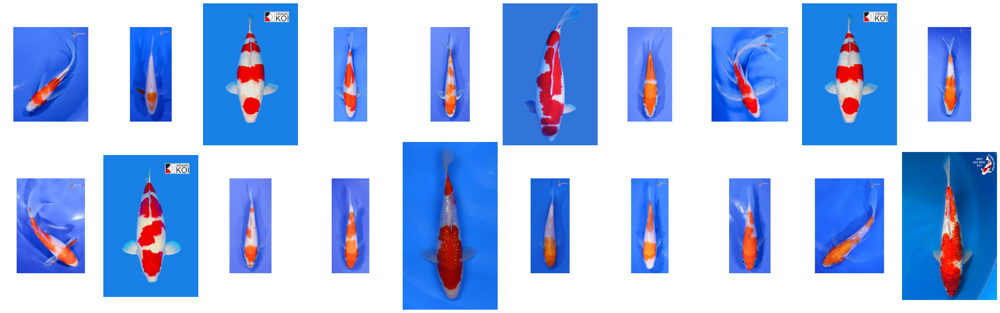

In [102]:
# check random 20 images of Kohaku

fig, ax = plt.subplots(2, 10, figsize=(30, 10))
ax = ax.flatten()

random_img_20 = np.floor(np.random.rand(20)*len(kohaku))

for i, idx in enumerate(random_img_20):
  filepath = '../pictures/' + kohaku.iloc[int(idx)]['image_path']
  image = mpimg.imread(filepath)
  ax[i].imshow(image)
  ax[i].axis('off')

plt.tight_layout()
plt.show()

### 2) Sanke

In [103]:
# get all the filepaths for 'Sanke'

sanke = df[df['tags'].apply(lambda x: 'Sanke' in x or 'sanke' in x)].copy()
sanke

,image_path,tags,uuid,length,price_length,cleaned_price
7,gckoi_data/743ba36_DAINICHI_BLOODLINE_SHOWA_17...,"['dainichi', 'fall 2024', 'koi', 'nisai', 'san...",743ba36,17.0,5,750.0
22,grandkoi_data/b1c670_Tancho Sanke.jpeg,"[Tancho, Sanke]",b1c670,22.0,9,3499.0
23,grandkoi_data/58e2f4_Tancho Sanke.jpeg,"[Tancho, Sanke]",58e2f4,22.0,9,2999.0
59,grandkoi_data/0a839c_Sanke-.jpeg,[Sanke],0a839c,34.0,10,32999.0
157,grandkoi_data/474f2b_Tancho Sanke.jpeg,"[Tancho, Sanke]",474f2b,24.0,9,3499.0
...,...,...,...,...,...,...
3057,sacramentokoi_data/e53be9_Sanke_19″_–_24036325...,[Sanke],e53be9,19.0,7,850.0
3058,sacramentokoi_data/b3d771_Sanke_19″_–_24066224...,[Sanke],b3d771,19.0,9,1900.0
3059,sacramentokoi_data/5146b2_Sanke_20″_–_24036325...,[Sanke],5146b2,20.0,7,900.0
3060,sacramentokoi_data/3a20b7_Sanke_21″_–_24036325...,[Sanke],3a20b7,21.0,9,1200.0


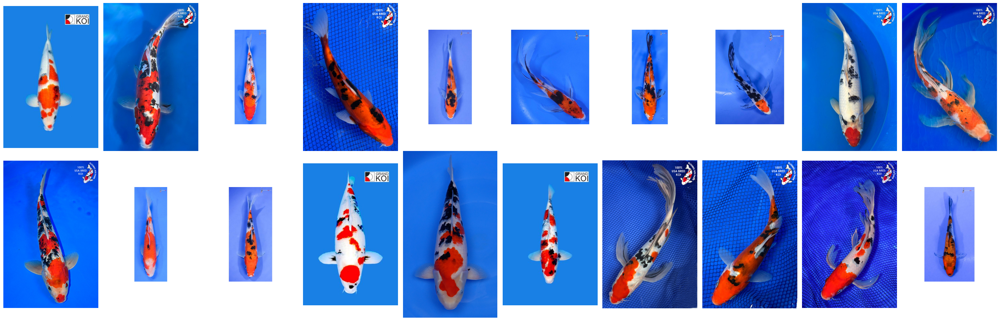

In [104]:
# check random 20 images of sanke

fig, ax = plt.subplots(2, 10, figsize=(30, 10))
ax = ax.flatten()

random_img_20 = np.floor(np.random.rand(20)*len(sanke))

for i, idx in enumerate(random_img_20):
  filepath = '../pictures/' + sanke.iloc[int(idx)]['image_path']
  image = mpimg.imread(filepath)
  ax[i].imshow(image)
  ax[i].axis('off')

plt.tight_layout()
plt.show()

### 3) Showa

In [105]:
# get all the filepaths for 'Showa'

showa = df[df['tags'].apply(lambda x: 'Showa' in x or 'showa' in x)].copy()
showa

,image_path,tags,uuid,length,price_length,cleaned_price
6,gckoi_data/1c880e6_DAINICHI_BLOODLINE_SHOWA_16...,"['dainichi', 'fall 2024', 'koi', 'nisai', 'sho...",1c880e6,16.0,5,750.0
8,gckoi_data/912e50e_DAINICHI_BLOODLINE_TANCHO_S...,"['fall 2024', 'koi', 'nisai', 'showa', 'suzusei']",912e50e,19.0,5,800.0
9,gckoi_data/e9349c2_DANICHI_BLOODLINE_SHOWA_18”...,"['dainichi', 'fall 2024', 'koi', 'nisai', 'sho...",e9349c2,18.0,5,600.0
10,gckoi_data/527c7ac_KOSHIJI_TANCHO_SHOWA_#1.jpg,"['fall 2024', 'koi', 'KOSHIJI', 'nisai', 'showa']",527c7ac,18.0,6,1200.0
12,gckoi_data/d491822_SUPER_RARE_HIGH_QUALITY_ISA...,"['fall 2024', 'isa', 'koi', 'nisai', 'showa']",d491822,18.0,6,3500.0
...,...,...,...,...,...,...
3089,sacramentokoi_data/d32e7b_Showa_21″_–_24033524...,[Showa],d32e7b,21.0,9,1600.0
3090,sacramentokoi_data/705e77_Showa_21″_–_24033525...,[Showa],705e77,21.0,9,1700.0
3091,sacramentokoi_data/68c40e_Showa_21″_–_24107124...,[Showa],68c40e,21.0,9,2300.0
3114,sacramentokoi_data/10e266_Tancho_Showa_15″_–_2...,"[Tancho, Showa]",10e266,15.0,7,375.0


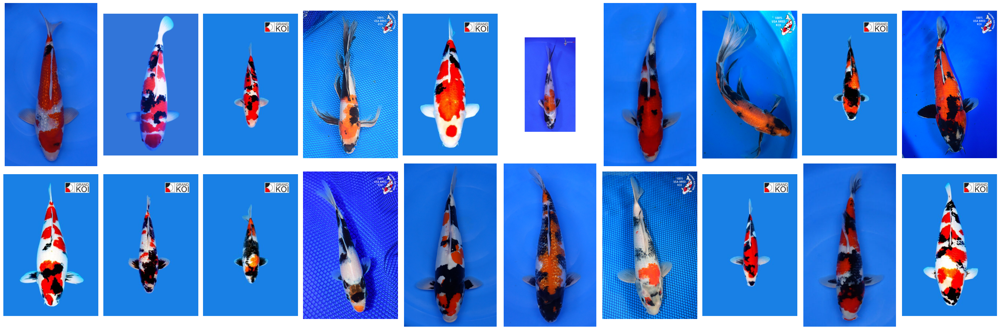

In [106]:
# check random 20 images of showa

fig, ax = plt.subplots(2, 10, figsize=(30, 10))
ax = ax.flatten()

random_img_20 = np.floor(np.random.rand(20)*len(showa))

for i, idx in enumerate(random_img_20):
  filepath = '../pictures/' + showa.iloc[int(idx)]['image_path']
  image = mpimg.imread(filepath)
  ax[i].imshow(image)
  ax[i].axis('off')

plt.tight_layout()
plt.show()

### 4) Tancho

In [107]:
# get all the filepaths for 'Tancho'

tancho = df[df['tags'].apply(lambda x: 'Tancho' in x or 'tancho' in x)].copy()
tancho

,image_path,tags,uuid,length,price_length,cleaned_price
22,grandkoi_data/b1c670_Tancho Sanke.jpeg,"[Tancho, Sanke]",b1c670,22.0,9,3499.00
23,grandkoi_data/58e2f4_Tancho Sanke.jpeg,"[Tancho, Sanke]",58e2f4,22.0,9,2999.00
24,grandkoi_data/9cd58f_Gin Rin Tancho Goshiki.jpeg,"[Gin, Rin, Tancho, Goshiki]",9cd58f,21.0,9,3999.00
25,grandkoi_data/64c486_Tancho Goshiki.jpeg,"[Tancho, Goshiki]",64c486,26.0,9,4999.00
118,grandkoi_data/a5900a_Tancho Kohaku.jpeg,"[Tancho, Kohaku]",a5900a,22.0,9,4999.00
119,grandkoi_data/9b6b54_Tancho Kohaku.jpeg,"[Tancho, Kohaku]",9b6b54,23.0,9,4999.00
120,grandkoi_data/f9b71b_Tancho Kohaku.jpeg,"[Tancho, Kohaku]",f9b71b,22.0,9,3999.00
121,grandkoi_data/0ab314_Tancho Kohaku.jpeg,"[Tancho, Kohaku]",0ab314,22.0,9,3999.00
122,grandkoi_data/a65473_Tancho Kohaku.jpeg,"[Tancho, Kohaku]",a65473,23.0,9,4999.00
123,grandkoi_data/899484_Tancho Kohaku.jpeg,"[Tancho, Kohaku]",899484,21.0,9,3999.00


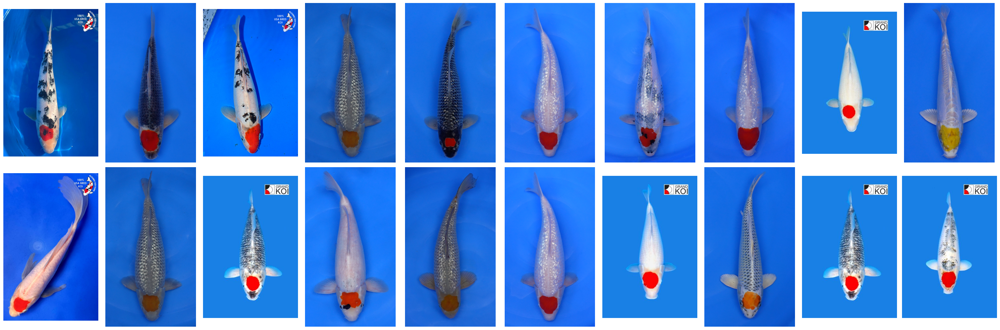

In [108]:
# check random 20 images of tancho

fig, ax = plt.subplots(2, 10, figsize=(30, 10))
ax = ax.flatten()

random_img_20 = np.floor(np.random.rand(20)*len(tancho))

for i, idx in enumerate(random_img_20):
  filepath = '../pictures/' + tancho.iloc[int(idx)]['image_path']
  image = mpimg.imread(filepath)
  ax[i].imshow(image)
  ax[i].axis('off')

plt.tight_layout()
plt.show()

# 5) GinRin

In [109]:
# get all the filepaths for 'Gin'

gin = df[df['tags'].apply(lambda x: 'Gin' in x or 'gin' in x)].copy()
gin

,image_path,tags,uuid,length,price_length,cleaned_price
13,grandkoi_data/12a49e_High Quality Gin Rin Show...,"[Gin, Rin, Showa]",12a49e,32.0,10,34999.0
14,grandkoi_data/9ac3a8_High Quality Gin Rin show...,"[Gin, Rin, showa]",9ac3a8,32.0,10,34999.0
18,grandkoi_data/66c804_Gin Rin Karashigoi.jpeg,"[Gin, Rin, Karashigoi]",66c804,28.0,9,6999.0
19,grandkoi_data/34353c_Gin Rin Benigoi.jpeg,"[Gin, Rin, Benigoi]",34353c,25.0,9,4999.0
24,grandkoi_data/9cd58f_Gin Rin Tancho Goshiki.jpeg,"[Gin, Rin, Tancho, Goshiki]",9cd58f,21.0,9,3999.0
...,...,...,...,...,...,...
3039,sacramentokoi_data/2871ba_Pearl_Gin_Rin_Sanke_...,"[Pearl, Gin, Rin, Sanke]",2871ba,14.0,7,475.0
3040,sacramentokoi_data/d4398b_Pearl_Gin_Rin_Sanke_...,"[Pearl, Gin, Rin, Sanke]",d4398b,15.0,7,525.0
3041,sacramentokoi_data/dd7ed3_Pearl_Gin_Rin_Sanke_...,"[Pearl, Gin, Rin, Sanke]",dd7ed3,15.0,7,500.0
3042,sacramentokoi_data/11f282_Pearl_Gin_Rin_Sanke_...,"[Pearl, Gin, Rin, Sanke]",11f282,15.0,7,500.0


In [110]:
# get all the filepaths for 'Ginrin'

ginrin = gin[gin['tags'].apply(lambda x: 'Rin' in x or 'rin' in x)].copy()
ginrin

,image_path,tags,uuid,length,price_length,cleaned_price
13,grandkoi_data/12a49e_High Quality Gin Rin Show...,"[Gin, Rin, Showa]",12a49e,32.0,10,34999.0
14,grandkoi_data/9ac3a8_High Quality Gin Rin show...,"[Gin, Rin, showa]",9ac3a8,32.0,10,34999.0
18,grandkoi_data/66c804_Gin Rin Karashigoi.jpeg,"[Gin, Rin, Karashigoi]",66c804,28.0,9,6999.0
19,grandkoi_data/34353c_Gin Rin Benigoi.jpeg,"[Gin, Rin, Benigoi]",34353c,25.0,9,4999.0
24,grandkoi_data/9cd58f_Gin Rin Tancho Goshiki.jpeg,"[Gin, Rin, Tancho, Goshiki]",9cd58f,21.0,9,3999.0
...,...,...,...,...,...,...
3039,sacramentokoi_data/2871ba_Pearl_Gin_Rin_Sanke_...,"[Pearl, Gin, Rin, Sanke]",2871ba,14.0,7,475.0
3040,sacramentokoi_data/d4398b_Pearl_Gin_Rin_Sanke_...,"[Pearl, Gin, Rin, Sanke]",d4398b,15.0,7,525.0
3041,sacramentokoi_data/dd7ed3_Pearl_Gin_Rin_Sanke_...,"[Pearl, Gin, Rin, Sanke]",dd7ed3,15.0,7,500.0
3042,sacramentokoi_data/11f282_Pearl_Gin_Rin_Sanke_...,"[Pearl, Gin, Rin, Sanke]",11f282,15.0,7,500.0


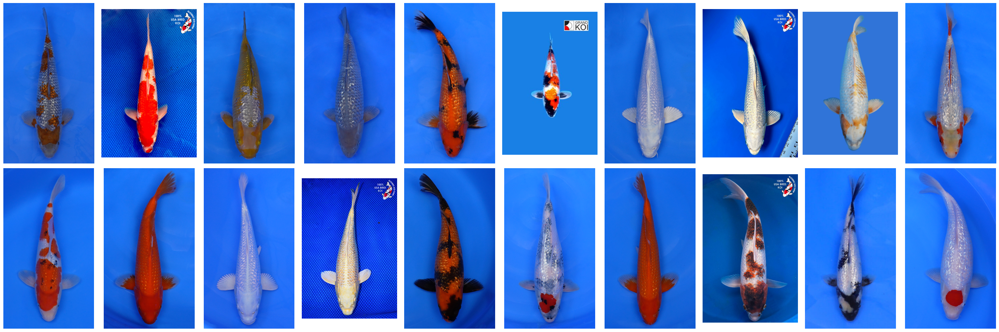

In [111]:
# check random 20 images of ginrin

fig, ax = plt.subplots(2, 10, figsize=(30, 10))
ax = ax.flatten()

random_img_20 = np.floor(np.random.rand(20)*len(ginrin))

for i, idx in enumerate(random_img_20):
  filepath = '../pictures/' + ginrin.iloc[int(idx)]['image_path']
  image = mpimg.imread(filepath)
  ax[i].imshow(image)
  ax[i].axis('off')

plt.tight_layout()
plt.show()

# Prepare Multi-Label

In [112]:
# get a sample image with multi-label

df.iloc[13]['tags']

['Gin', 'Rin', 'Showa']

In [113]:
# create a new list to collect only the target labels

multi_label = []
labels_list = ['gin', 'rin', 'tancho', 'kohaku', 'showa', 'sanke']
for tag in df.iloc[13]['tags']:
  if tag.lower() in labels_list:
    multi_label.append(tag)

multi_label

['Gin', 'Rin', 'Showa']

In [114]:
# create a function to collect the target labels

def get_target_labels(row):
  multi_label = []
  labels_list = ['gin', 'rin', 'tancho', 'kohaku', 'showa', 'sanke']

  for tag in row['tags']:
    if tag.lower() in labels_list:
      multi_label.append(tag)

  return multi_label

In [115]:
# apply the function to create a new column

df['multi_label'] = df.apply(get_target_labels, axis=1)

In [116]:
# filter the dataframe with only images that do not have empty multi_label

df['not_empty'] = df['multi_label'].apply(lambda x: x!=[])

In [117]:
df = df[df['not_empty']]
df

,image_path,tags,uuid,length,price_length,cleaned_price,multi_label,not_empty
13,grandkoi_data/12a49e_High Quality Gin Rin Show...,"[Gin, Rin, Showa]",12a49e,32.0,10,34999.0,"[Gin, Rin, Showa]",True
14,grandkoi_data/9ac3a8_High Quality Gin Rin show...,"[Gin, Rin, showa]",9ac3a8,32.0,10,34999.0,"[Gin, Rin, showa]",True
18,grandkoi_data/66c804_Gin Rin Karashigoi.jpeg,"[Gin, Rin, Karashigoi]",66c804,28.0,9,6999.0,"[Gin, Rin]",True
19,grandkoi_data/34353c_Gin Rin Benigoi.jpeg,"[Gin, Rin, Benigoi]",34353c,25.0,9,4999.0,"[Gin, Rin]",True
22,grandkoi_data/b1c670_Tancho Sanke.jpeg,"[Tancho, Sanke]",b1c670,22.0,9,3499.0,"[Tancho, Sanke]",True
...,...,...,...,...,...,...,...,...
3111,sacramentokoi_data/83d8dc_Tancho_Ochiba_14″_–_...,"[Tancho, Ochiba]",83d8dc,14.0,7,375.0,[Tancho],True
3112,sacramentokoi_data/0e4681_Tancho_Sakura_Ogon_2...,"[Tancho, Sakura, Ogon]",0e4681,20.0,7,950.0,[Tancho],True
3113,sacramentokoi_data/84af0c_Tancho_Sakura_Ogon_2...,"[Tancho, Sakura, Ogon]",84af0c,22.0,9,2100.0,[Tancho],True
3114,sacramentokoi_data/10e266_Tancho_Showa_15″_–_2...,"[Tancho, Showa]",10e266,15.0,7,375.0,"[Tancho, Showa]",True


In [120]:
# export dataset to json

with open('data/df_5labels.json', 'w') as f:
  json.dump(df.to_dict(orient='records'), f)